In [2]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra
from sentence_transformers import SentenceTransformer



df = pd.read_csv("data/articles.csv")

In [3]:
df.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."


In [4]:
def compile_text(x):


    text =  f"""Article_Id: {x['article_id']},  
                Product Code: {x['product_code']}, 
                Prod Name: {x['prod_name']}, 
                Product Type No: {x['product_type_no']}, 
                Product Type Name: {x['product_type_name']}, 
                Product Group Name: {x['product_group_name']}, 
                Department Name: {x['department_name']},
                Index Code: {x['index_code']},
                Index Name: {x['index_name']}, 
                Index Group Name: {x['index_group_name']},
                Detail Desc: {x['detail_desc']}
            """

    return text

sentences = df.apply(lambda x: compile_text(x), axis=1).tolist()



model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

output = model.encode(sentences=sentences, show_progress_bar= True, normalize_embeddings  = True)

df_embedding = pd.DataFrame(output)
df_embedding


df_embedding.to_csv("embedding_articles_train.csv",index = False)


Batches:   0%|          | 0/3299 [00:00<?, ?it/s]

In [ ]:
df_embedding = pd.read_csv("embedding_articles_train.csv")

In [5]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)


df_embedding_with_out = df_embedding.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [8]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

In [16]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(df, 
                        x='comp1', 
                        y='comp2', 
                        z='comp3',
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter(df, 
                        x='comp1', 
                        y='comp2', 
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


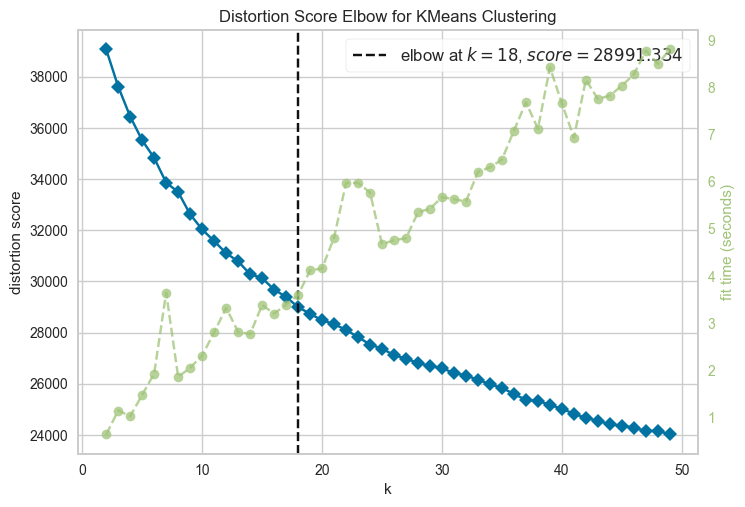

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [12]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,50), locate_elbow=True)
 
visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

In [13]:
n_clusters = 18

In [14]:
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out)

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


24696.388671875


In [17]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)

In [18]:
sampling_data.head()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
86431,-0.029425,0.022850,0.025333,-0.047000,-0.002053,-0.011539,0.060075,-0.001994,0.021614,0.066757,...,-0.127907,0.015686,0.010939,0.026153,0.054723,0.031123,0.065553,-0.146397,-0.020353,0.058112
5984,-0.085874,0.051075,0.000912,-0.003243,-0.019366,0.015521,0.054015,-0.008081,-0.076140,-0.041884,...,-0.066732,0.051174,0.002086,0.021323,0.041339,-0.012969,0.069073,-0.156366,0.001817,0.069560
55446,-0.075438,0.011088,-0.034513,-0.055059,-0.015539,0.018186,0.083921,0.089896,-0.003021,0.077169,...,-0.104060,0.081009,-0.013842,-0.004073,0.016788,0.011444,-0.017214,-0.138762,-0.015452,0.046237
81613,-0.085164,0.071992,0.002588,0.000300,-0.041603,0.033259,0.072106,0.040681,-0.024239,-0.001302,...,-0.057049,0.064474,-0.024126,-0.017201,0.025040,0.066369,-0.026149,-0.086058,-0.058492,0.100016
23756,-0.043674,0.058149,-0.011712,-0.002735,-0.013518,-0.031802,0.027556,0.055417,0.006192,0.037811,...,-0.086860,0.045368,-0.053561,0.039507,-0.000603,-0.008789,0.041060,-0.135659,-0.044269,-0.028389


In [39]:
# Make sure that 'sampling_data' has an index that corresponds to the original 'df'
sampling_data['prod_name'] = df.loc[sampling_data.index, 'prod_name']
sampling_data['product_group_name'] = df.loc[sampling_data.index, 'product_group_name']

In [40]:
sampling_data.head()

,0,1,2,3,4,5,6,7,8,9,...,376,377,378,379,380,381,382,383,prod_name,product_group_name
86431,-0.029425,0.022850,0.025333,-0.047000,-0.002053,-0.011539,0.060075,-0.001994,0.021614,0.066757,...,0.010939,0.026153,0.054723,0.031123,0.065553,-0.146397,-0.020353,0.058112,Teis dress,Garment Full body
5984,-0.085874,0.051075,0.000912,-0.003243,-0.019366,0.015521,0.054015,-0.008081,-0.076140,-0.041884,...,0.002086,0.021323,0.041339,-0.012969,0.069073,-0.156366,0.001817,0.069560,FRAME Easy Iron,Garment Upper body
55446,-0.075438,0.011088,-0.034513,-0.055059,-0.015539,0.018186,0.083921,0.089896,-0.003021,0.077169,...,-0.013842,-0.004073,0.016788,0.011444,-0.017214,-0.138762,-0.015452,0.046237,PAM CANVAS CAP,Accessories
81613,-0.085164,0.071992,0.002588,0.000300,-0.041603,0.033259,0.072106,0.040681,-0.024239,-0.001302,...,-0.024126,-0.017201,0.025040,0.066369,-0.026149,-0.086058,-0.058492,0.100016,Lula jumpsuit DEAL,Garment Full body
23756,-0.043674,0.058149,-0.011712,-0.002735,-0.013518,-0.031802,0.027556,0.055417,0.006192,0.037811,...,-0.053561,0.039507,-0.000603,-0.008789,0.041060,-0.135659,-0.044269,-0.028389,Draco dress,Garment Full body


In [23]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

def drawing(sampling_data):
    labels = sampling_data['prod_name'].tolist()
    # Convert tokens to a NumPy array
    tokens = np.array(sampling_data.drop('prod_name', axis=1).values)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


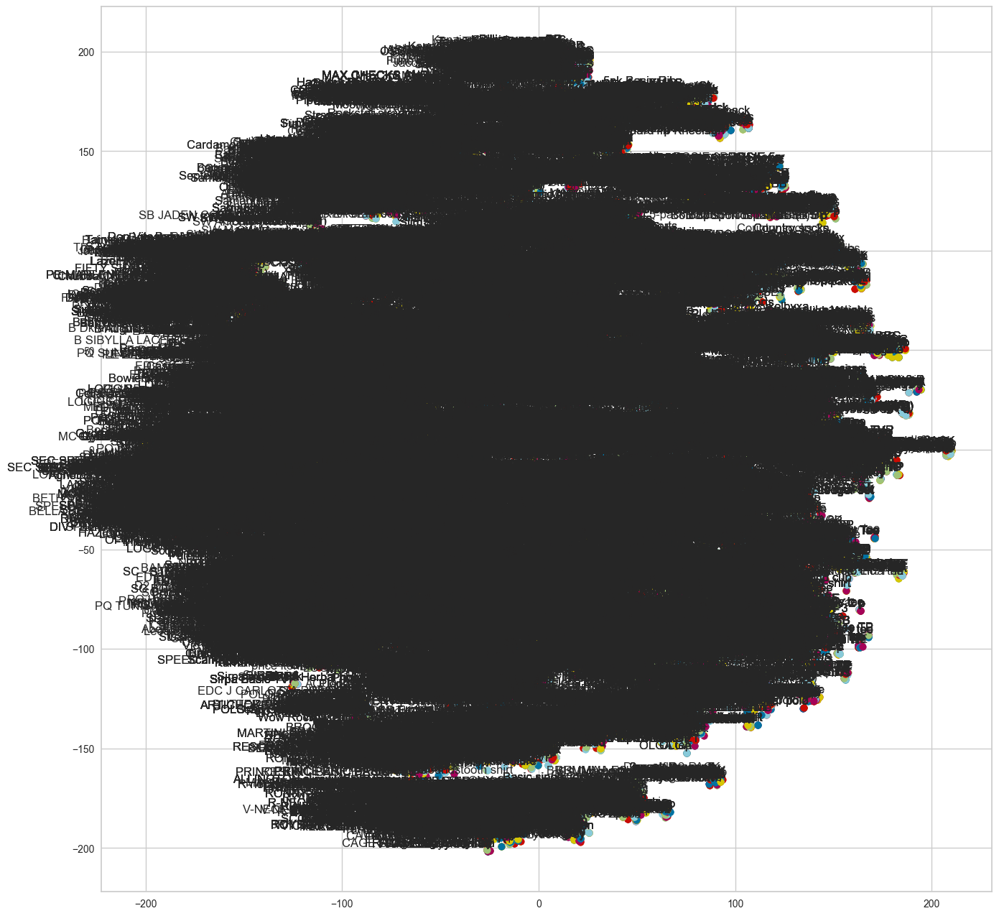

In [24]:
drawing(sampling_data)

In [41]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values
sampling_data.head()

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
86431,-0.029425,0.022850,0.025333,-0.047000,-0.002053,-0.011539,0.060075,-0.001994,0.021614,0.066757,...,-0.127907,0.015686,0.010939,0.026153,0.054723,0.031123,0.065553,-0.146397,-0.020353,0.058112
5984,-0.085874,0.051075,0.000912,-0.003243,-0.019366,0.015521,0.054015,-0.008081,-0.076140,-0.041884,...,-0.066732,0.051174,0.002086,0.021323,0.041339,-0.012969,0.069073,-0.156366,0.001817,0.069560
55446,-0.075438,0.011088,-0.034513,-0.055059,-0.015539,0.018186,0.083921,0.089896,-0.003021,0.077169,...,-0.104060,0.081009,-0.013842,-0.004073,0.016788,0.011444,-0.017214,-0.138762,-0.015452,0.046237
81613,-0.085164,0.071992,0.002588,0.000300,-0.041603,0.033259,0.072106,0.040681,-0.024239,-0.001302,...,-0.057049,0.064474,-0.024126,-0.017201,0.025040,0.066369,-0.026149,-0.086058,-0.058492,0.100016
23756,-0.043674,0.058149,-0.011712,-0.002735,-0.013518,-0.031802,0.027556,0.055417,0.006192,0.037811,...,-0.086860,0.045368,-0.053561,0.039507,-0.000603,-0.008789,0.041060,-0.135659,-0.044269,-0.028389


In [42]:
# Make sure that 'sampling_data' has an index that corresponds to the original 'df'
sampling_data['prod_name'] = df.loc[sampling_data.index, 'prod_name']
sampling_data['product_group_name'] = df.loc[sampling_data.index, 'product_group_name']
sampling_data.head()

,0,1,2,3,4,5,6,7,8,9,...,376,377,378,379,380,381,382,383,prod_name,product_group_name
86431,-0.029425,0.022850,0.025333,-0.047000,-0.002053,-0.011539,0.060075,-0.001994,0.021614,0.066757,...,0.010939,0.026153,0.054723,0.031123,0.065553,-0.146397,-0.020353,0.058112,Teis dress,Garment Full body
5984,-0.085874,0.051075,0.000912,-0.003243,-0.019366,0.015521,0.054015,-0.008081,-0.076140,-0.041884,...,0.002086,0.021323,0.041339,-0.012969,0.069073,-0.156366,0.001817,0.069560,FRAME Easy Iron,Garment Upper body
55446,-0.075438,0.011088,-0.034513,-0.055059,-0.015539,0.018186,0.083921,0.089896,-0.003021,0.077169,...,-0.013842,-0.004073,0.016788,0.011444,-0.017214,-0.138762,-0.015452,0.046237,PAM CANVAS CAP,Accessories
81613,-0.085164,0.071992,0.002588,0.000300,-0.041603,0.033259,0.072106,0.040681,-0.024239,-0.001302,...,-0.024126,-0.017201,0.025040,0.066369,-0.026149,-0.086058,-0.058492,0.100016,Lula jumpsuit DEAL,Garment Full body
23756,-0.043674,0.058149,-0.011712,-0.002735,-0.013518,-0.031802,0.027556,0.055417,0.006192,0.037811,...,-0.053561,0.039507,-0.000603,-0.008789,0.041060,-0.135659,-0.044269,-0.028389,Draco dress,Garment Full body


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.manifold import TSNE

def generate_tsne(sampling_data, perplexity=40, n_iter=2500):
    # Assuming 'sampling_data' is a DataFrame with 'prod_name' column and numerical features
    labels = sampling_data['prod_name'].tolist()
    # Convert features to a NumPy array for t-SNE
    features = sampling_data.drop(['prod_name', 'product_group_name'], axis=1).values
    #features = sampling_data.drop('prod_name', axis=1).values
    
    tsne_model = TSNE(perplexity=perplexity, n_components=2, init='pca', n_iter=n_iter, random_state=23)
    tsne_values = tsne_model.fit_transform(features)
    
    # Create a DataFrame for the t-SNE output
    tsne_df = pd.DataFrame(tsne_values, columns=["comp1", "comp2"])
    tsne_df["prod_name"] = labels
    return tsne_df

def plot_pca_2d(df, title="t-SNE Space", opacity=0.8, width_line=0.1):
    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    # Assuming 'prod_name' is the column with labels to be shown on hover
    fig = px.scatter(df, 
                     x='comp1', 
                     y='comp2', 
                     color='cluster',
                     hover_data=['prod_name'],  # Add hover data
                     template="plotly",
                     color_discrete_sequence=px.colors.qualitative.Vivid,
                     title=title).update_traces(
                         marker={
                             "size": 8,
                             "opacity": opacity,
                             "line": {
                                 "width": width_line,
                                 "color": "black"
                             }
                         }
                     ).update_layout(
                         width=800, 
                         height=700, 
                         autosize=False, 
                         showlegend=True,
                         legend=dict(title_font_family="Times New Roman", font=dict(size=20)),
                         xaxis_title='comp1',
                         yaxis_title='comp2',
                         font=dict(family="Gilroy", color='black', size=15)
                     )
    fig.show()


# Example usage:
# Assuming 'sampling_data' is your input DataFrame and 'sampling_clusters' is a Series or list of cluster labels
tsne_df = generate_tsne(sampling_data)  # Generate t-SNE DataFrame
tsne_df["cluster"] = sampling_clusters # Add the cluster labels to your DataFrame
plot_pca_2d(tsne_df, title="t-SNE Space", opacity=0.5, width_line=0.5)  # Plot the results


In [32]:
!pip install -r requirements.txt

     ---------------------------------------- 8.8/8.8 MB 18.8 MB/s eta 0:00:00
  Using cached bleach-3.3.0-py2.py3-none-any.whl (283 kB)
     ------------------------------------- 383.3/383.3 KB 11.7 MB/s eta 0:00:00
     ------------------------------------- 475.1/475.1 KB 29.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached chardet-4.0.0-py2.py3-none-any.whl (178 kB)
     ---------------------------------------- 75.3/75.3 KB ? eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------- 189.0/189.0 KB 11.2 MB/s eta 0:00:00
     ---------------------------------------- 3.5/3.5 MB 24.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------- 188.2/188.2 KB 11.1 MB/s eta 0:00:00
  Preparing metadata (setu

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\iambatman\\AppData\\Local\\Temp\\pip-uninstall-9figsqlj\\_cffi_backend.cp310-win_amd64.pyd'
Consider using the `--user` option or check the permissions.

You should consider upgrading via the 'C:\Users\iambatman\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [44]:
import dash
from dash import dcc, html, Input, Output, State
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE

# Assuming 'sampling_data' is your DataFrame with 'prod_name', and numerical features for t-SNE

# Function to generate t-SNE DataFrame
def generate_tsne(sampling_data, perplexity=40, n_iter=2500):
    labels = sampling_data['prod_name'].tolist()
    #features = sampling_data.drop('prod_name', axis=1).values
    features = sampling_data.drop(['prod_name', 'product_group_name'], axis=1).values
    tsne_model = TSNE(perplexity=perplexity, n_components=2, init='pca', n_iter=n_iter, random_state=23)
    tsne_values = tsne_model.fit_transform(features)
    tsne_df = pd.DataFrame(tsne_values, columns=["comp1", "comp2"])
    tsne_df["prod_name"] = labels
    return tsne_df

# Initialize the Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    # Dropdown for selecting clusters
    dcc.Dropdown(
        id='cluster-dropdown',
        options=[],  # Options will be set by the callback after t-SNE computation
        placeholder="Select a cluster",
        multi=True
    ),
    # Dropdown for selecting product names
    dcc.Dropdown(
        id='prod-name-dropdown',
        options=[{'label': i, 'value': i} for i in sampling_data['product_group_name'].unique()],
        placeholder="Select a product name",
        multi=True
    ),
    # Button to trigger t-SNE computation
    html.Button('Generate t-SNE Plot', id='generate-tsne', n_clicks=0),
    # Graph component to display the scatter plot
    dcc.Graph(id='scatter-plot'),
])

@app.callback(
    Output('cluster-dropdown', 'options'),
    [Input('generate-tsne', 'n_clicks')],
    prevent_initial_call=True  # Prevents the callback from firing upon app initialization
)
def set_cluster_options(n_clicks):
    if n_clicks > 0:
        tsne_df = generate_tsne(sampling_data)
        # Here you should define 'sampling_clusters' or ensure it is available in the scope
        tsne_df["cluster"] = sampling_clusters
        return [{'label': str(i), 'value': i} for i in tsne_df['cluster'].unique()]
    return []

@app.callback(
    Output('scatter-plot', 'figure'),
    [Input('generate-tsne', 'n_clicks')],
    [State('cluster-dropdown', 'value'),
     State('prod-name-dropdown', 'value')]
)
def update_plot(n_clicks, selected_clusters, selected_prod_names):
    # Check if the button is clicked
    if n_clicks > 0:
        # Generate t-SNE DataFrame
        tsne_df = generate_tsne(sampling_data)
        # Define or make sure that 'sampling_clusters' is available in the scope
        tsne_df["cluster"] = sampling_clusters

        # Filter dataframe based on the dropdown selection
        if selected_clusters is not None:
            tsne_df = tsne_df[tsne_df['cluster'].isin(selected_clusters)]
        if selected_prod_names is not None:
            tsne_df = tsne_df[tsne_df['prod_name'].isin(selected_prod_names)]

        # Create the figure
        fig = px.scatter(tsne_df, 
                         x='comp1', 
                         y='comp2', 
                         color='cluster',
                         hover_data=['prod_name'],
                         title="t-SNE Space")
        return fig
    else:
        # Return empty figure if button is not clicked
        return px.scatter(title="Click the button to generate t-SNE plot")

if __name__ == '__main__':
    app.run_server(debug=True)


In [45]:
import dash
from dash import dcc, html, Input, Output, State
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE

# Assuming 'sampling_data' is your DataFrame with 'prod_name', 'product_group_name', and numerical features for t-SNE

# Function to generate t-SNE DataFrame
def generate_tsne(sampling_data, perplexity=40, n_iter=2500):
    features = sampling_data.drop(['prod_name', 'product_group_name'], axis=1).values
    tsne_model = TSNE(perplexity=perplexity, n_components=2, init='pca', n_iter=n_iter, random_state=23)
    tsne_values = tsne_model.fit_transform(features)
    tsne_df = pd.DataFrame(tsne_values, columns=["comp1", "comp2"])
    tsne_df["prod_name"] = sampling_data['prod_name']
    tsne_df["product_group_name"] = sampling_data['product_group_name']  # Retain this for filtering
    return tsne_df

# Initialize the Dash app
app = dash.Dash(__name__)

app.layout = html.Div([
    # Dropdown for selecting product group names
    dcc.Dropdown(
        id='product-group-dropdown',
        options=[{'label': i, 'value': i} for i in sampling_data['product_group_name'].unique()],
        placeholder="Select a product group",
        multi=True
    ),
    # Button to trigger t-SNE computation
    html.Button('Generate t-SNE Plot', id='generate-tsne', n_clicks=0),
    
    # Status message
    html.Div(id='status-message'),

    # Loading component wrapped around Graph component
    dcc.Loading(
        id="loading-1",
        type="default",
        children=html.Div(dcc.Graph(id='scatter-plot'))
    ),
])

@app.callback(
    [Output('scatter-plot', 'figure'),
     Output('status-message', 'children')],
    [Input('generate-tsne', 'n_clicks')],
    [State('product-group-dropdown', 'value')],
    prevent_initial_call=True
)
def update_plot(n_clicks, selected_product_groups):
    if n_clicks:
        # Generate t-SNE DataFrame
        tsne_df = generate_tsne(sampling_data)
        tsne_df["cluster"] = sampling_clusters  # You need to have 'sampling_clusters' defined somewhere

        # Filter dataframe based on the dropdown selection
        if selected_product_groups:
            tsne_df = tsne_df[tsne_df['product_group_name'].isin(selected_product_groups)]

        # Create the figure
        fig = px.scatter(tsne_df, 
                         x='comp1', 
                         y='comp2', 
                         color='cluster',
                         hover_data=['prod_name'],
                         title="t-SNE Space",
                         labels={'prod_name': 'Product Name'})
        # Return the figure and the status message
        return fig, "Running..."

    # If button is not clicked, return the default state
    return px.scatter(title="Click the button to generate t-SNE plot"), "Select a product group and generate the plot."

if __name__ == '__main__':
    #app.run_server(debug=True)
    app.run_server(mode='inline', height=1200, port=1234)
